<h1> Model Recovery<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Model-comparison" data-toc-modified-id="Model-comparison-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Model comparison</a></span></li><li><span><a href="#Confusion-matrix-and-Inversion-matrix" data-toc-modified-id="Confusion-matrix-and-Inversion-matrix-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Confusion matrix and Inversion matrix</a></span><ul class="toc-item"><li><span><a href="#Default-settings" data-toc-modified-id="Default-settings-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Default settings</a></span></li><li><span><a href="#Fewer-trial-numbers" data-toc-modified-id="Fewer-trial-numbers-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Fewer trial numbers</a></span></li></ul></li><li><span><a href="#Add-bias-terms-(important-for-real-data)" data-toc-modified-id="Add-bias-terms-(important-for-real-data)-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Add bias terms (important for real data)</a></span><ul class="toc-item"><li><span><a href="#Fit-data-with-and-without-bias" data-toc-modified-id="Fit-data-with-and-without-bias-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Fit data with and without bias</a></span></li><li><span><a href="#Confusion-matrix" data-toc-modified-id="Confusion-matrix-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Confusion matrix</a></span></li></ul></li></ul></div>

In [1]:
%reload_ext autoreload
%autoreload 2

# Uncomment next line to enable interactive plots!
# %matplotlib inline
%matplotlib notebook
# %matplotlib widget

import numpy as np
from utils.run_model_recovery import *
import multiprocessing as mp
import matplotlib.pyplot as plt

n_worker = int(mp.cpu_count()/2)
pool = mp.Pool(processes = n_worker)
    
# Parameter settings
n_trials = 1000

# Model comparison

Just some examples here

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/8:    LossCounting, Km = 2 ... AIC = 5.38629, BIC = 15.2018 (done in 7.84 secs)
Model 2/8:     RW1972_epsi, Km = 2 ... AIC = 1230.95, BIC = 1240.77 (done in 3.82 secs)
Model 3/8:     LNP_softmax, Km = 2 ... AIC = 706.503, BIC = 716.318 (done in 4.73 secs)
Model 4/8:     LNP_softmax, Km = 4 ... AIC = 710.503, BIC = 730.134 (done in 9.21 secs)
Model 5/8:  RW1972_softmax, Km = 2 ... AIC = 994.983, BIC = 1004.8 (done in 3.59 secs)
Model 6/8:     Hattori2019, Km = 3 ... AIC = 996.982, BIC = 1011.71 (done in 5.19 secs)
Model 7/8:        Bari2019, Km = 3 ... AIC = 721.361, BIC = 736.084 (done in 8.64 secs)
Model 8/8:     Hattori2019, Km = 4 ... AIC = 527.221, BIC = 546.852 (done in 7.33 secs)


<IPython.core.display.Javascript object>


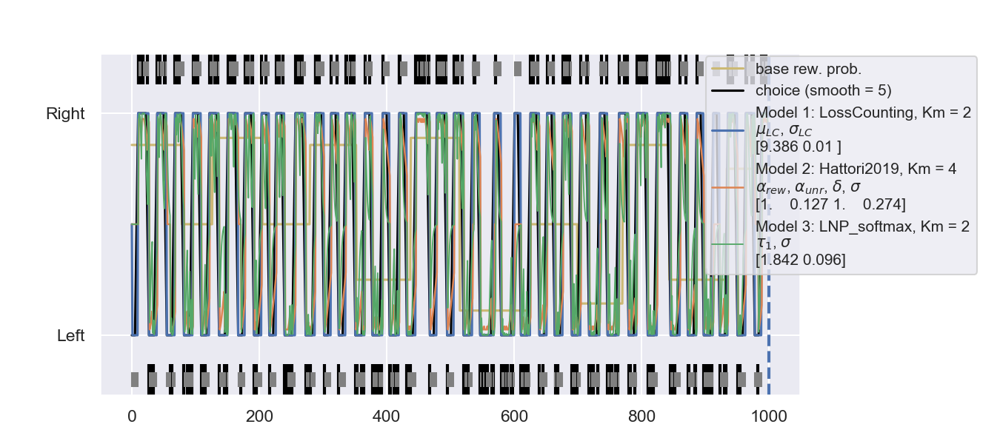

,model,Km,AIC,log10_BF_AIC,model_weight_AIC,BIC,log10_BF_BIC,model_weight_BIC,para_notation,para_fitted
1,LossCounting,2,5.39,-0.00,1.0,15.20,-0.00,1.0,"$\mu_{LC}$, $\sigma_{LC}$","[9.386, 0.01]"
8,Hattori2019,4,527.22,-113.32,0.0,546.85,-115.45,0.0,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[1.0, 0.127, 1.0, 0.274]"
3,LNP_softmax,2,706.50,-152.25,0.0,716.32,-152.25,0.0,"$\tau_1$, $\sigma$","[1.842, 0.096]"
4,LNP_softmax,4,710.50,-153.11,0.0,730.13,-155.25,0.0,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$","[1.842, 25.7, 1.0, 0.096]"
7,Bari2019,3,721.36,-155.47,0.0,736.08,-156.54,0.0,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.043, 0.391, 0.01]"
5,RW1972_softmax,2,994.98,-214.89,0.0,1004.80,-214.89,0.0,"$\alpha_{rew}$, $\sigma$","[0.999, 0.01]"
6,Hattori2019,3,996.98,-215.32,0.0,1011.71,-216.39,0.0,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$","[1.0, 0.999, 0.012]"
2,RW1972_epsi,2,1230.95,-266.13,0.0,1240.77,-266.13,0.0,"$\alpha_{rew}$, $\epsilon$","[0.755, 0.594]"


<IPython.core.display.Javascript object>


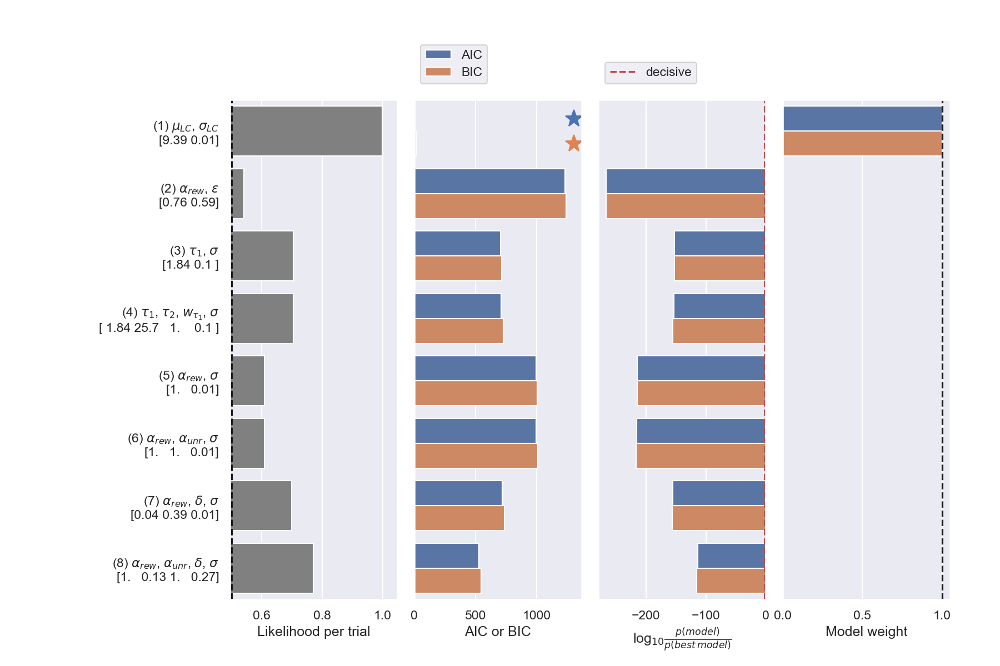

In [8]:
choice_history, reward_history, p_reward = generate_fake_data('LossCounting', ['loss_count_threshold_mean','loss_count_threshold_std'], [10,0])
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward, models = [1,2,3,4,5,6,7,8])
model_comparison.fit(pool = pool, plot_predictive=[1,2,3])  # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()

The right panel is log10([Bayes factor](https://en.wikipedia.org/wiki/Bayes_factor)), which is the relative likelihood of the $i$th model (using AIC as an example): <br>

\begin{equation}
Bayes\,factor = relative\,likelihood = \frac{p(data|model_i)}{p(data|best\, model)} = \frac{exp(E_{m,i})}{exp(E_{m,best})} = \frac{exp(-AIC_i/2)}{exp(-AIC_{min}/2)} = exp(-(AIC_i - AIC_{min})/2)
\end{equation}

If log10(Bayes factor) is smaller than -2, then the model comparison is considered "[decisive](https://en.wikipedia.org/wiki/Bayes_factor)" (the vertical red dashed line).<br>
Btw, AIC has been suggested [to be better](https://en.wikipedia.org/wiki/Akaike_information_criterion#Comparisons_with_other_model_selection_methods). Asymptotically, minimizing the [AIC is equivalent to minimizing the CV value in LOOCV](https://dzone.com/articles/why-every-statistician-should). This is true for any model (Stone 1977).

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/8:    LossCounting, Km = 2 ... AIC = 1280.3, BIC = 1290.11 (done in 4.28 secs)
Model 2/8:     RW1972_epsi, Km = 2 ... AIC = 1098.42, BIC = 1108.24 (done in 4.34 secs)
Model 3/8:     LNP_softmax, Km = 2 ... AIC = 1048.2, BIC = 1058.01 (done in 4.58 secs)
Model 4/8:     LNP_softmax, Km = 4 ... AIC = 1050.49, BIC = 1070.12 (done in 8.85 secs)
Model 5/8:  RW1972_softmax, Km = 2 ... AIC = 1001.17, BIC = 1010.98 (done in 2.98 secs)
Model 6/8:     Hattori2019, Km = 3 ... AIC = 1003.09, BIC = 1017.81 (done in 5.05 secs)
Model 7/8:        Bari2019, Km = 3 ... AIC = 1003.17, BIC = 1017.89 (done in 4.84 secs)
Model 8/8:     Hattori2019, Km = 4 ... AIC = 1005.09, BIC = 1024.72 (done in 6.55 secs)


<IPython.core.display.Javascript object>


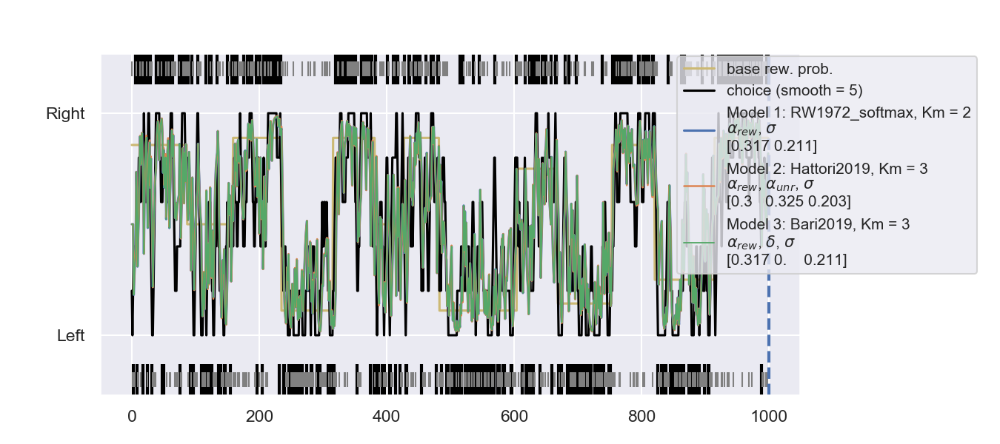

,model,Km,AIC,log10_BF_AIC,model_weight_AIC,BIC,log10_BF_BIC,model_weight_BIC,para_notation,para_fitted
5,RW1972_softmax,2,1001.17,-0.00,0.53,1010.98,-0.00,0.94,"$\alpha_{rew}$, $\sigma$","[0.317, 0.211]"
6,Hattori2019,3,1003.09,-0.42,0.20,1017.81,-1.48,0.03,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$","[0.3, 0.325, 0.203]"
7,Bari2019,3,1003.17,-0.43,0.19,1017.89,-1.50,0.03,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.317, 0.0, 0.211]"
8,Hattori2019,4,1005.09,-0.85,0.07,1024.72,-2.98,0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.3, 0.325, 0.0, 0.203]"
3,LNP_softmax,2,1048.20,-10.21,0.00,1058.01,-10.21,0.00,"$\tau_1$, $\sigma$","[2.563, 0.243]"
4,LNP_softmax,4,1050.49,-10.71,0.00,1070.12,-12.84,0.00,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$","[1.942, 8.34, 0.704, 0.233]"
2,RW1972_epsi,2,1098.42,-21.12,0.00,1108.24,-21.12,0.00,"$\alpha_{rew}$, $\epsilon$","[0.308, 0.439]"
1,LossCounting,2,1280.30,-60.61,0.00,1290.11,-60.61,0.00,"$\mu_{LC}$, $\sigma_{LC}$","[6.414, 10.0]"


<IPython.core.display.Javascript object>


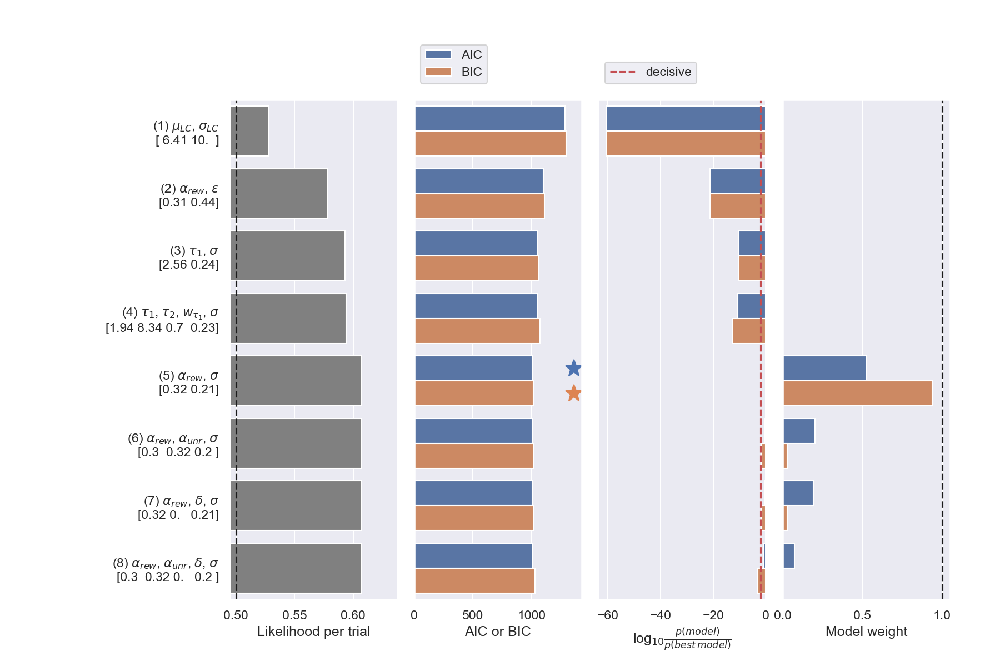

In [7]:
choice_history, reward_history, p_reward = generate_fake_data('RW1972_softmax', ['learn_rate_rew','softmax_temperature'], [0.3,0.2])
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward, models = [1,2,3,4,5,6,7,8])
model_comparison.fit(pool = pool, plot_predictive=[1,2,3]) # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/8:    LossCounting, Km = 2 ... AIC = 1333.8, BIC = 1343.61 (done in 4.21 secs)
Model 2/8:     RW1972_epsi, Km = 2 ... AIC = 1194.04, BIC = 1203.86 (done in 3.51 secs)
Model 3/8:     LNP_softmax, Km = 2 ... AIC = 1164.74, BIC = 1174.56 (done in 4.8 secs)
Model 4/8:     LNP_softmax, Km = 4 ... AIC = 1168.24, BIC = 1187.87 (done in 19.2 secs)
Model 5/8:  RW1972_softmax, Km = 2 ... AIC = 1129.31, BIC = 1139.13 (done in 3.2 secs)
Model 6/8:     Hattori2019, Km = 3 ... AIC = 1131.19, BIC = 1145.92 (done in 3.85 secs)
Model 7/8:        Bari2019, Km = 3 ... AIC = 1131.31, BIC = 1146.04 (done in 5.89 secs)
Model 8/8:     Hattori2019, Km = 4 ... AIC = 1133.19, BIC = 1152.82 (done in 6.63 secs)


<IPython.core.display.Javascript object>


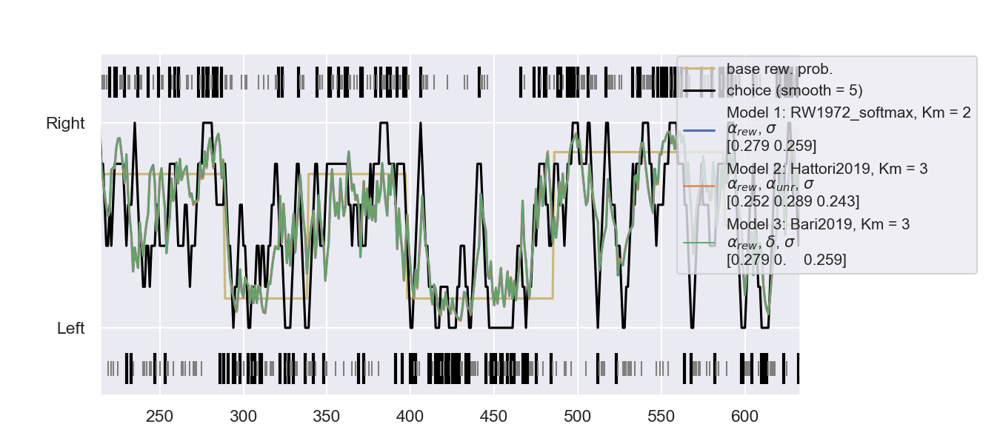

,model,Km,AIC,log10_BF_AIC,model_weight_AIC,BIC,log10_BF_BIC,model_weight_BIC,para_notation,para_fitted
5,RW1972_softmax,2,1129.31,-0.00,0.53,1139.13,-0.00,0.94,"$\alpha_{rew}$, $\sigma$","[0.279, 0.259]"
6,Hattori2019,3,1131.19,-0.41,0.21,1145.92,-1.47,0.03,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$","[0.252, 0.289, 0.243]"
7,Bari2019,3,1131.31,-0.43,0.19,1146.04,-1.50,0.03,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.279, 0.0, 0.259]"
8,Hattori2019,4,1133.19,-0.84,0.08,1152.82,-2.97,0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.252, 0.289, 0.0, 0.243]"
3,LNP_softmax,2,1164.74,-7.69,0.00,1174.56,-7.69,0.00,"$\tau_1$, $\sigma$","[3.104, 0.279]"
4,LNP_softmax,4,1168.24,-8.45,0.00,1187.87,-10.58,0.00,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$","[2.772, 16.546, 0.847, 0.266]"
2,RW1972_epsi,2,1194.04,-14.06,0.00,1203.86,-14.06,0.00,"$\alpha_{rew}$, $\epsilon$","[0.365, 0.547]"
1,LossCounting,2,1333.80,-44.40,0.00,1343.61,-44.40,0.00,"$\mu_{LC}$, $\sigma_{LC}$","[4.88, 10.0]"


<IPython.core.display.Javascript object>


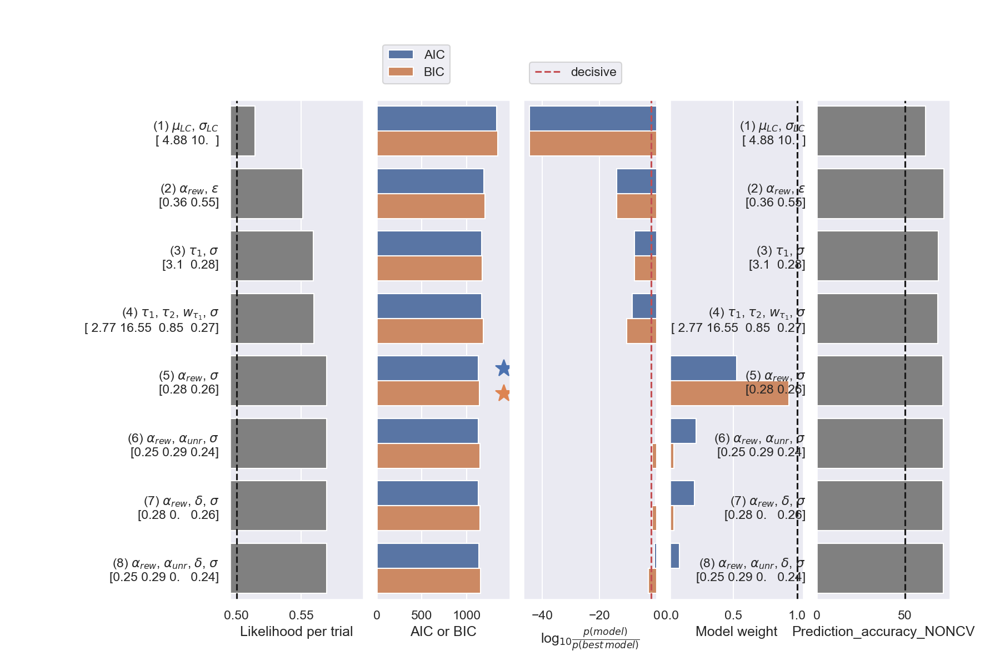

In [4]:
choice_history, reward_history, p_reward = generate_fake_data('Hattori2019', ['learn_rate_rew','learn_rate_unrew', 'forget_rate','softmax_temperature'], 
                                                      [0.23392543, 0.318161268, 0.0034, 0.22], n_trials = 1000)  # Almost Hattori et al.
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward, models = [1,2,3,4,5,6,7,8])
model_comparison.fit(pool = pool, plot_predictive=[1,2,3])  # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()


<IPython.core.display.Javascript object>


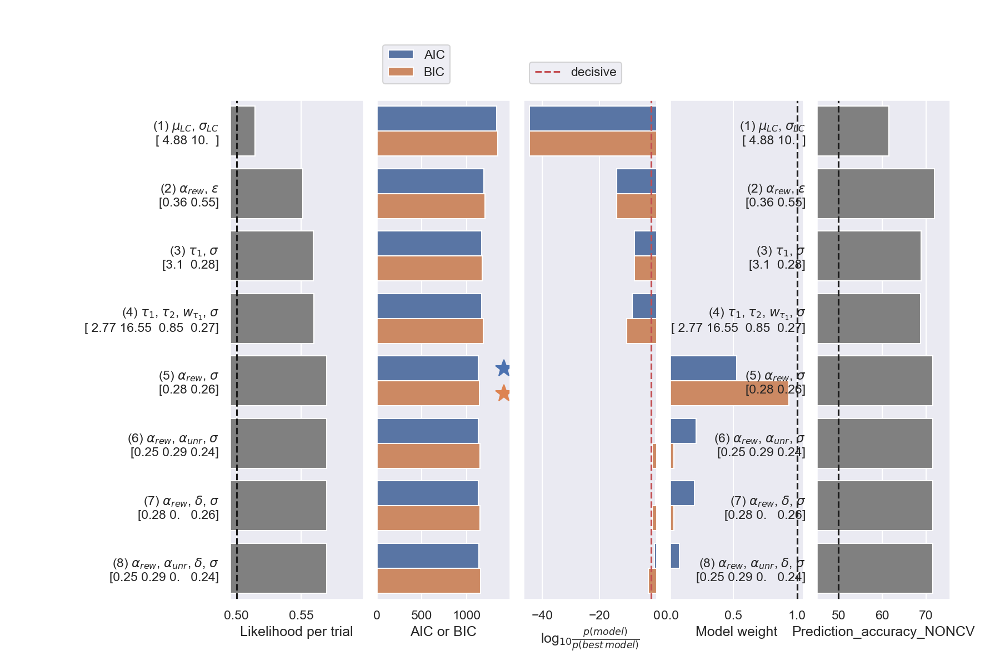

In [5]:
model_comparison.plot()

Try to fit the behavior of some special foragers

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/8:    LossCounting, Km = 2 ... AIC = 1402.49, BIC = 1412.3 (done in 11.7 secs)
Model 2/8:     RW1972_epsi, Km = 2 ... AIC = 1390.08, BIC = 1399.9 (done in 3.58 secs)
Model 3/8:     LNP_softmax, Km = 2 ... AIC = 1388.94, BIC = 1398.75 (done in 2.24 secs)
Model 4/8:     LNP_softmax, Km = 4 ... AIC = 1392.94, BIC = 1412.57 (done in 4.13 secs)
Model 5/8:  RW1972_softmax, Km = 2 ... AIC = 1388.52, BIC = 1398.33 (done in 1.83 secs)
Model 6/8:     Hattori2019, Km = 3 ... AIC = 1389.22, BIC = 1403.94 (done in 3.26 secs)
Model 7/8:        Bari2019, Km = 3 ... AIC = 1390.42, BIC = 1405.14 (done in 2.82 secs)
Model 8/8:     Hattori2019, Km = 4 ... AIC = 1390.84, BIC = 1410.47 (done in 6.86 secs)


<IPython.core.display.Javascript object>


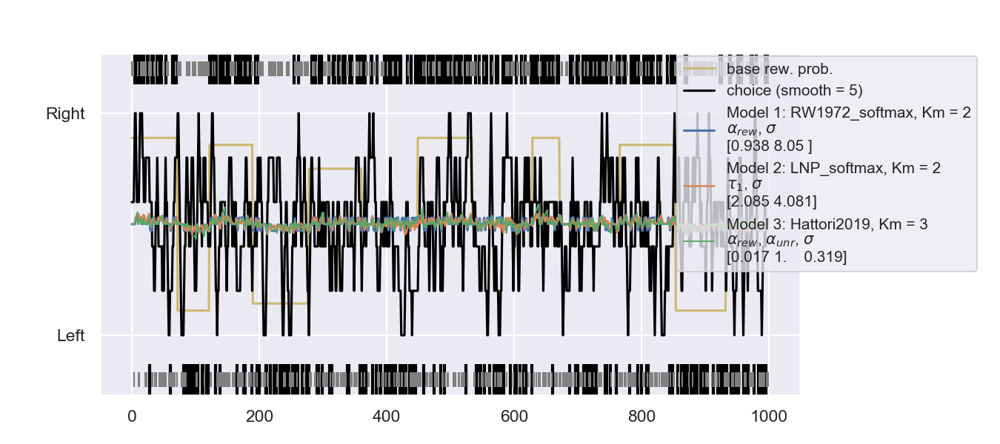

,model,Km,AIC,log10_BF_AIC,BIC,log10_BF_BIC,para_notation,para_fitted
5,RW1972_softmax,2,1388.52,-0.00,1398.33,-0.00,"$\alpha_{rew}$, $\sigma$","[0.938, 8.05]"
3,LNP_softmax,2,1388.94,-0.09,1398.75,-0.09,"$\tau_1$, $\sigma$","[2.085, 4.081]"
6,Hattori2019,3,1389.22,-0.15,1403.94,-1.22,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$","[0.017, 1.0, 0.319]"
2,RW1972_epsi,2,1390.08,-0.34,1399.90,-0.34,"$\alpha_{rew}$, $\epsilon$","[0.024, 0.992]"
7,Bari2019,3,1390.42,-0.41,1405.14,-1.48,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.775, 0.126, 5.908]"
8,Hattori2019,4,1390.84,-0.50,1410.47,-2.64,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.007, 1.0, 0.0, 0.091]"
4,LNP_softmax,4,1392.94,-0.96,1412.57,-3.09,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$","[2.085, 38.997, 1.0, 4.081]"
1,LossCounting,2,1402.49,-3.03,1412.30,-3.03,"$\mu_{LC}$, $\sigma_{LC}$","[1.48, 10.0]"


<IPython.core.display.Javascript object>


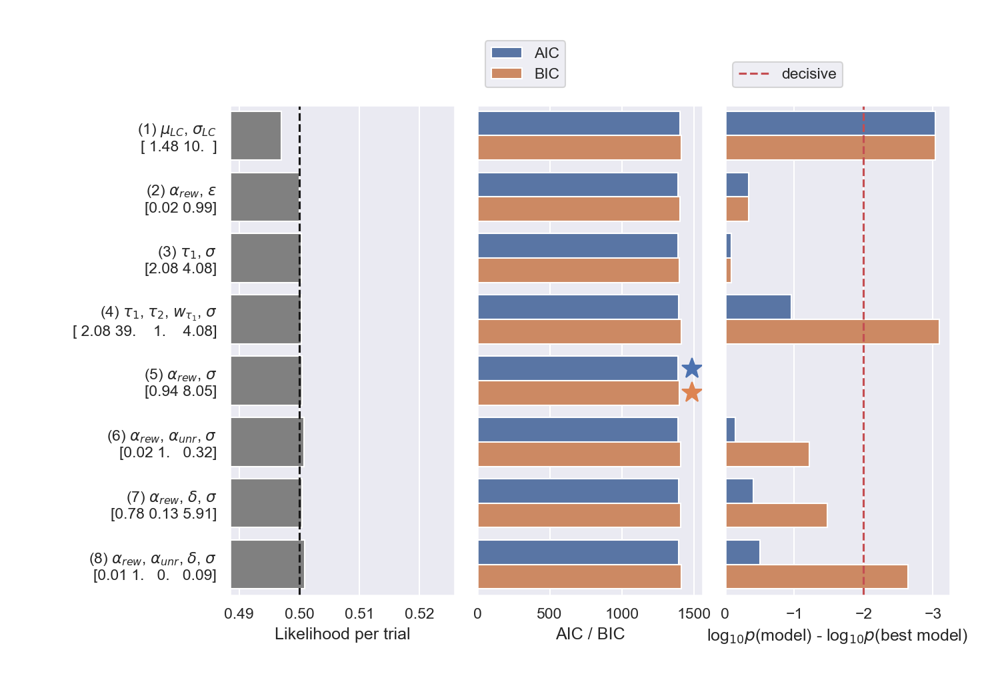

In [6]:
choice_history, reward_history, p_reward = generate_fake_data('Random', [],[], n_trials = 1000)  # Almost Hattori et al.
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward)
model_comparison.fit(pool = pool, plot_predictive=[1,2,3])  # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()

Note that these models cannot differentiate IdealpHatGreedy and pMatching.

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/15:    LossCounting, Km = 2 ... AIC = 1348.81, BIC = 1358.62 (done in 4.97 secs)
Model 2/15:     RW1972_epsi, Km = 2 ... AIC = 1387.6, BIC = 1397.41 (done in 2.47 secs)
Model 3/15:     LNP_softmax, Km = 2 ... AIC = 1081.49, BIC = 1091.3 (done in 3.49 secs)
Model 4/15:     LNP_softmax, Km = 4 ... AIC = 1085.48, BIC = 1105.12 (done in 7.1 secs)
Model 5/15:  RW1972_softmax, Km = 2 ... AIC = 1380.63, BIC = 1390.45 (done in 2.93 secs)
Model 6/15:     Hattori2019, Km = 3 ... AIC = 1392.29, BIC = 1407.02 (done in 1.78 secs)
Model 7/15:        Bari2019, Km = 3 ... AIC = 1086.35, BIC = 1101.07 (done in 9.31 secs)
Model 8/15:     Hattori2019, Km = 4 ... AIC = 1038.51, BIC = 1058.14 (done in 7.53 secs)
Model 9/15:     RW1972_epsi, Km = 3 ... AIC = 1390.38, BIC = 1405.11 (done in 5.6 secs)
Model 10/15:     LNP_softmax, Km = 3 ... AIC = 1083.43, BIC = 1098.15 (done in 7.99 secs)
Model 11/15:     LNP_softmax, Km = 5 ... 

<IPython.core.display.Javascript object>


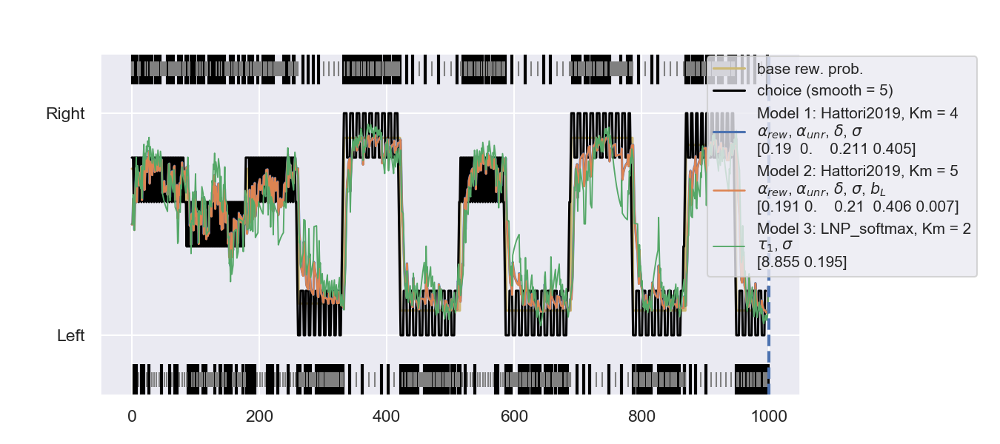

,model,Km,AIC,log10_BF_AIC,model_weight_AIC,BIC,log10_BF_BIC,model_weight_BIC,para_notation,para_fitted
8,Hattori2019,4,1038.51,-0.00,0.73,1058.14,-0.00,0.97,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.19, 0.0, 0.211, 0.405]"
15,Hattori2019,5,1040.50,-0.43,0.27,1065.04,-1.50,0.03,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$, $b_L$","[0.191, 0.0, 0.21, 0.406, 0.007]"
3,LNP_softmax,2,1081.49,-9.33,0.00,1091.30,-7.20,0.00,"$\tau_1$, $\sigma$","[8.855, 0.195]"
10,LNP_softmax,3,1083.43,-9.75,0.00,1098.15,-8.69,0.00,"$\tau_1$, $\sigma$, $b_L$","[8.835, 0.194, 0.018]"
4,LNP_softmax,4,1085.48,-10.20,0.00,1105.12,-10.20,0.00,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$","[8.824, 16.211, 1.0, 0.195]"
7,Bari2019,3,1086.35,-10.39,0.00,1101.07,-9.32,0.00,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.006, 0.104, 0.01]"
11,LNP_softmax,5,1087.43,-10.62,0.00,1111.97,-11.69,0.00,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$, $b_L$","[8.835, 21.872, 1.0, 0.194, 0.018]"
14,Bari2019,4,1088.29,-10.81,0.00,1107.92,-10.81,0.00,"$\alpha_{rew}$, $\delta$, $\sigma$, $b_L$","[0.006, 0.104, 0.01, 0.017]"
1,LossCounting,2,1348.81,-67.38,0.00,1358.62,-65.25,0.00,"$\mu_{LC}$, $\sigma_{LC}$","[5.773, 10.0]"
5,RW1972_softmax,2,1380.63,-74.29,0.00,1390.45,-72.16,0.00,"$\alpha_{rew}$, $\sigma$","[0.017, 0.324]"


In [6]:
choice_history, reward_history, p_reward = generate_fake_data('IdealpHatGreedy', [],[], n_trials = 1000)  # Almost Hattori et al.
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward, models = [
            # No bias (1-8)
            ['LossCounting', ['loss_count_threshold_mean', 'loss_count_threshold_std'], [0,0], [40,10]],                   
            ['RW1972_epsi', ['learn_rate_rew', 'epsilon'],[0, 0],[1, 1]],
            ['LNP_softmax',  ['tau1', 'softmax_temperature'], [1e-3, 1e-2], [100, 15]],                 
            ['LNP_softmax', ['tau1', 'tau2', 'w_tau1', 'softmax_temperature'],[1e-3, 1e-1, 0, 1e-2],[15, 40, 1, 15]],                 
            ['RW1972_softmax', ['learn_rate_rew', 'softmax_temperature'],[0, 1e-2],[1, 15]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            ['Bari2019', ['learn_rate_rew', 'forget_rate', 'softmax_temperature'],[0, -1, 1e-2],[1, 1, 15]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'softmax_temperature'],[0, 0, -1, 1e-2],[1, 1, 1, 15]],
            
            # With bias (9-15)
            ['RW1972_epsi', ['learn_rate_rew', 'epsilon', 'biasL'],[0, 0, -0.5],[1, 1, 0.5]],
            ['LNP_softmax',  ['tau1', 'softmax_temperature', 'biasL'], [1e-3, 1e-2, -5], [100, 15, 5]],                 
            ['LNP_softmax', ['tau1', 'tau2', 'w_tau1', 'softmax_temperature', 'biasL'],[1e-3, 1e-1, 0, 1e-2, -5],[15, 40, 1, 15, 5]],                 
            ['RW1972_softmax', ['learn_rate_rew', 'softmax_temperature', 'biasL'],[0, 1e-2, -5],[1, 15, 5]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'softmax_temperature', 'biasL'],[0, 0, 1e-2, -5],[1, 1, 15, 5]],
            ['Bari2019', ['learn_rate_rew', 'forget_rate', 'softmax_temperature', 'biasL'],[0, -1, 1e-2, -5],[1, 1, 15, 5]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'softmax_temperature', 'biasL'],[0, 0, -1, 1e-2, -5],[1, 1, 1, 15, 5]],
         ]
)
model_comparison.fit(pool = pool, plot_predictive=[1,2,3])  # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()


<IPython.core.display.Javascript object>


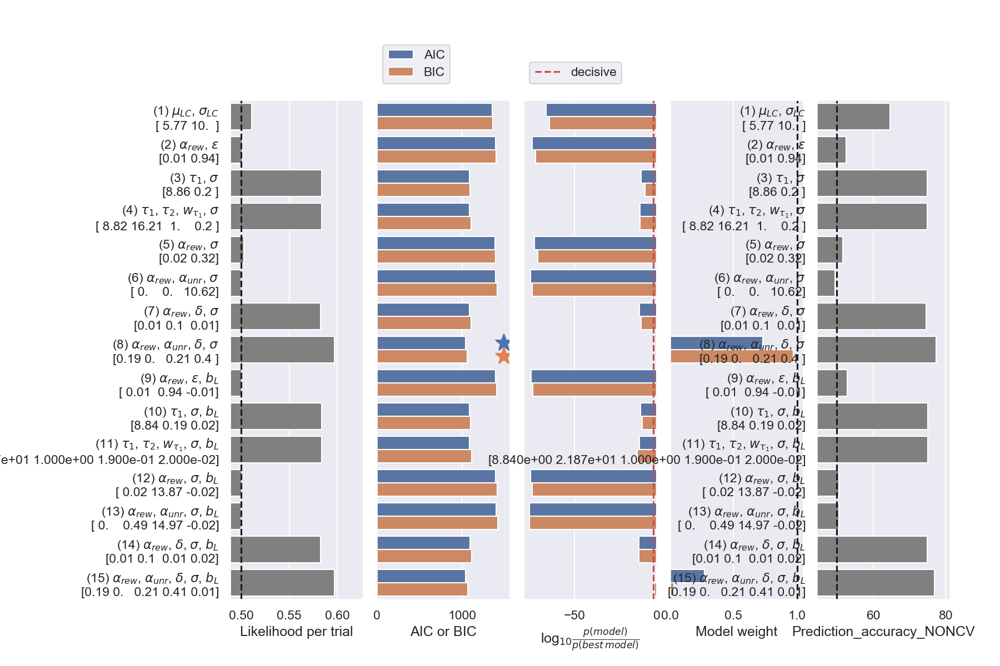

In [10]:
model_comparison.plot()

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/8:    LossCounting, Km = 2 ... AIC = 1378.93, BIC = 1388.75 (done in 5.27 secs)
Model 2/8:     RW1972_epsi, Km = 2 ... AIC = 1246.02, BIC = 1255.84 (done in 4.15 secs)
Model 3/8:     LNP_softmax, Km = 2 ... AIC = 1046.68, BIC = 1056.49 (done in 3.77 secs)
Model 4/8:     LNP_softmax, Km = 4 ... AIC = 1050.68, BIC = 1070.31 (done in 7.09 secs)
Model 5/8:  RW1972_softmax, Km = 2 ... AIC = 1232.33, BIC = 1242.15 (done in 3.89 secs)
Model 6/8:     Hattori2019, Km = 3 ... AIC = 1229.4, BIC = 1244.12 (done in 4.76 secs)
Model 7/8:        Bari2019, Km = 3 ... AIC = 1050.32, BIC = 1065.04 (done in 9.44 secs)
Model 8/8:     Hattori2019, Km = 4 ... AIC = 1017.16, BIC = 1036.79 (done in 6.95 secs)


<IPython.core.display.Javascript object>


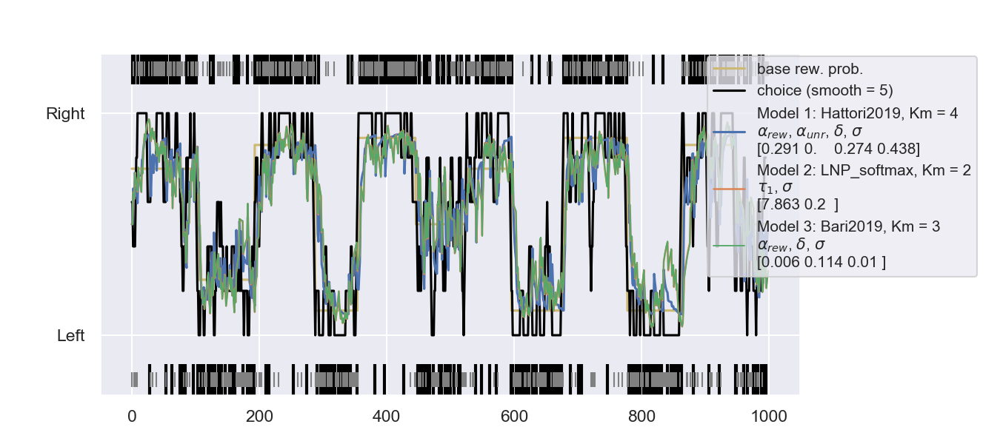

,model,Km,AIC,log10_BF_AIC,BIC,log10_BF_BIC,para_notation,para_fitted
8,Hattori2019,4,1017.16,-0.00,1036.79,-0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.291, 0.0, 0.274, 0.438]"
3,LNP_softmax,2,1046.68,-6.41,1056.49,-4.28,"$\tau_1$, $\sigma$","[7.863, 0.2]"
7,Bari2019,3,1050.32,-7.20,1065.04,-6.13,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.006, 0.114, 0.01]"
4,LNP_softmax,4,1050.68,-7.28,1070.31,-7.28,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$","[7.863, 11.154, 1.0, 0.2]"
6,Hattori2019,3,1229.40,-46.09,1244.12,-45.02,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$","[0.006, 0.079, 0.021]"
5,RW1972_softmax,2,1232.33,-46.72,1242.15,-44.59,"$\alpha_{rew}$, $\sigma$","[0.058, 0.131]"
2,RW1972_epsi,2,1246.02,-49.70,1255.84,-47.57,"$\alpha_{rew}$, $\epsilon$","[0.056, 0.625]"
1,LossCounting,2,1378.93,-78.56,1388.75,-76.43,"$\mu_{LC}$, $\sigma_{LC}$","[8.921, 10.0]"


<IPython.core.display.Javascript object>


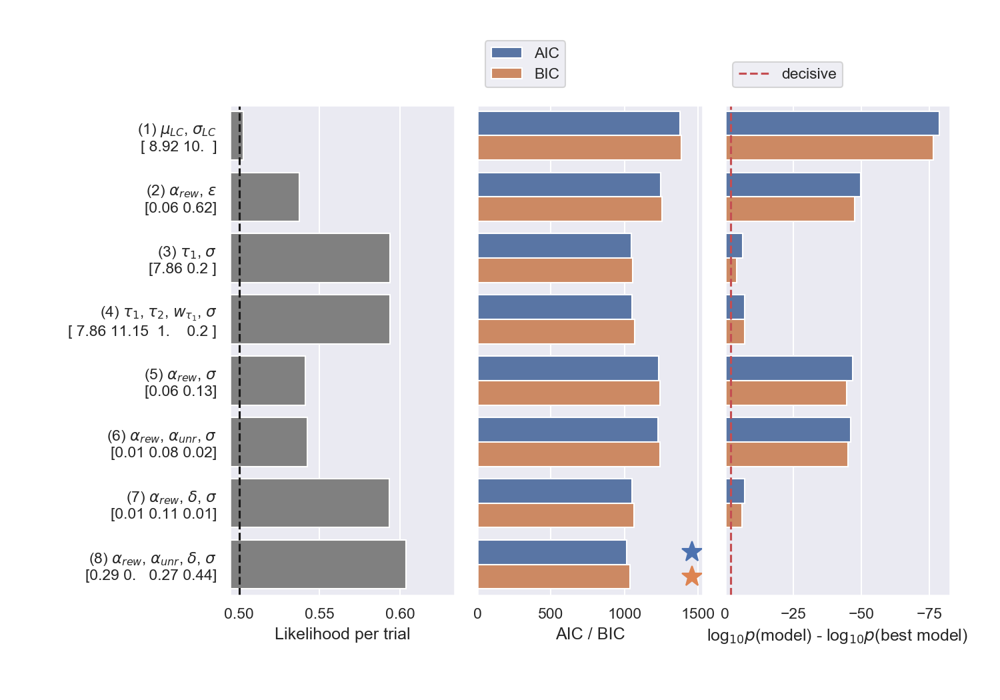

In [8]:
choice_history, reward_history, p_reward = generate_fake_data('pMatching', [],[], n_trials = 1000)  # Almost Hattori et al.
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward)
model_comparison.fit(pool = pool, plot_predictive=[1,2,3])  # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()

# Confusion matrix and Inversion matrix

## Default settings

The range for generating parameters:

```python
def generate_random_para(para_name):
    # With slightly narrower range than fitting bounds in BanditModelComparison
    if para_name in 'loss_count_threshold_mean':
        return np.random.uniform(0, 30)
    elif para_name in 'loss_count_threshold_std':
        return np.random.uniform(0, 5)
    elif para_name in ['tau1', 'tau2']:
        return 10**np.random.uniform(0, np.log10(30)) 
    elif para_name in ['w_tau1', 'learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'epsilon']:
        return np.random.uniform(0, 1)
    elif para_name in 'softmax_temperature':
        return 1/np.random.exponential(10)
```

<font size=3>Don't try to rerun this... It took 9.5 hours!

In [6]:
models = [
            ['LossCounting', ['loss_count_threshold_mean', 'loss_count_threshold_std'], [0,0], [40,10]],                   
            ['RW1972_epsi', ['learn_rate_rew', 'epsilon'],[0, 0],[1, 1]],
            ['LNP_softmax',  ['tau1', 'softmax_temperature'], [1e-3, 1e-2], [100, 15]],                 
            ['LNP_softmax', ['tau1', 'tau2', 'w_tau1', 'softmax_temperature'],[1e-3, 1e-1, 0, 1e-2],[15, 40, 1, 15]],                 
            ['RW1972_softmax', ['learn_rate_rew', 'softmax_temperature'],[0, 1e-2],[1, 15]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            ['Bari2019', ['learn_rate_rew', 'forget_rate', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'softmax_temperature'],[0, 0, 0, 1e-2],[1, 1, 1, 15]],
         ]

compute_confusion_matrix(models = models, n_runs = 100, n_trials = 1000, pool = pool)

Runs: 100%|███████████████████████████████████████████████████████████████████████| 100/100 [9:32:03<00:00, 343.23s/it]


Load results and plot

<IPython.core.display.Javascript object>


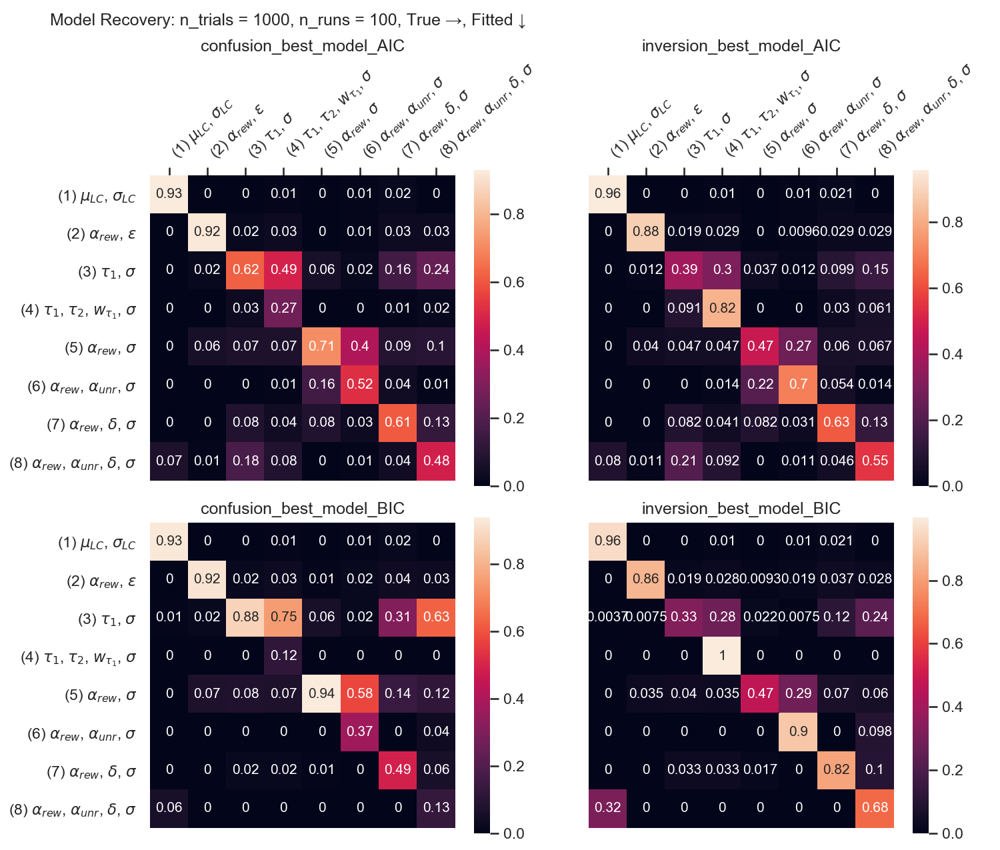

<IPython.core.display.Javascript object>


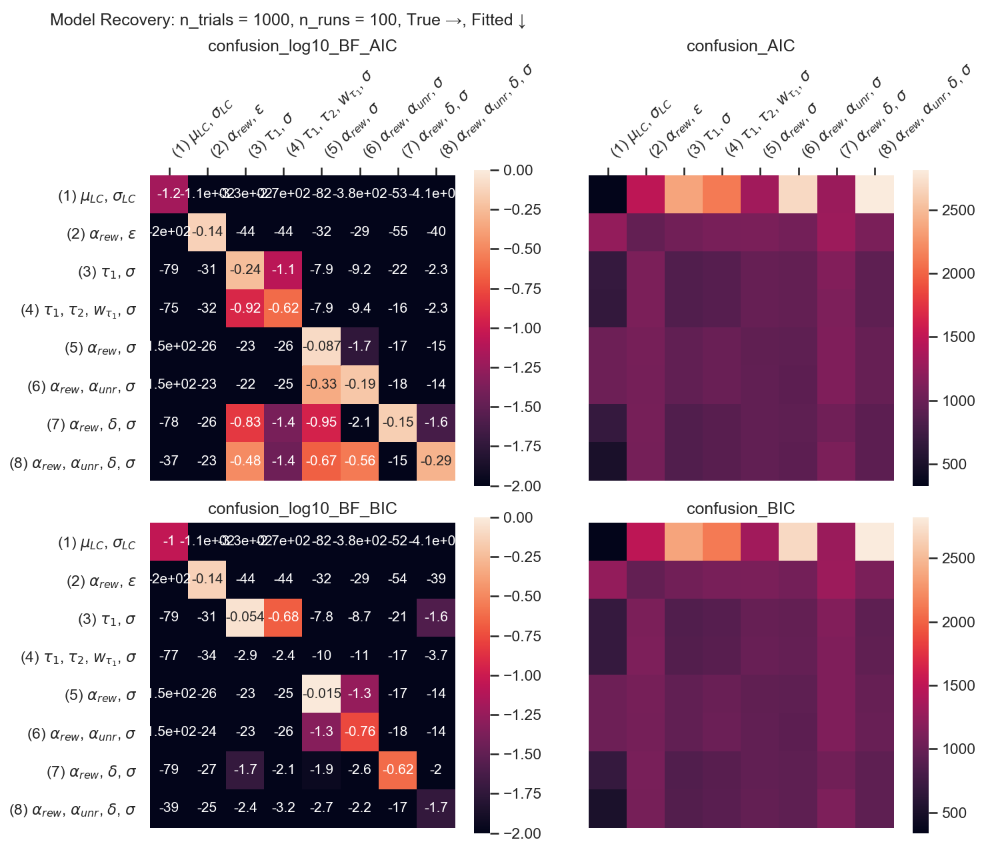

In [12]:
from plot_fitting import plot_confusion_matrix
confusion_results = pickle.load(open(".\\results\\confusion_results_1_100_1000.p", "rb"))
plot_confusion_matrix(confusion_results, order = [1,4,2,3,5,7,6,8])

Finally we got this! As expected, AIC looks better. <br>

1. The crosstalk between models are highly correlated with their similarities:

- [4,3]: When $\tau_1=\tau_2$, model (4) --> (3)
- [6,5] and [8,7]: When $\alpha_{unr} = \alpha_{rew}$, model (6) --> (5), model (8) --> (7)
- [7,3] and [8,3]: When $\delta = \alpha$, RL-like --> local INCOME in LNP!


2.  The model (3) $\tau_1, \sigma$ (Sugrue 2004) is the most versatile one. Because it's simple.
3.  Compare (3) and (5) --> INCOME and RETURN are different. 
4.  Compare (2) and (5) --> $\epsilon$ and $\sigma$ are different.

## Fewer trial numbers

I wanted to increase the trial number, but too slow. So try fewer trials...

In [7]:
models = [
            ['LossCounting', ['loss_count_threshold_mean', 'loss_count_threshold_std'], [0,0], [40,10]],                   
            ['RW1972_epsi', ['learn_rate_rew', 'epsilon'],[0, 0],[1, 1]],
            ['LNP_softmax',  ['tau1', 'softmax_temperature'], [1e-3, 1e-2], [100, 15]],                 
            ['LNP_softmax', ['tau1', 'tau2', 'w_tau1', 'softmax_temperature'],[1e-3, 1e-1, 0, 1e-2],[15, 40, 1, 15]],                 
            ['RW1972_softmax', ['learn_rate_rew', 'softmax_temperature'],[0, 1e-2],[1, 15]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            ['Bari2019', ['learn_rate_rew', 'forget_rate', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'softmax_temperature'],[0, 0, 0, 1e-2],[1, 1, 1, 15]],
         ]

compute_confusion_matrix(models = models, n_runs = 50, n_trials = 500, pool = pool, save_file = 'confusion_results_2_50_500.p')

Runs: 100%|█████████████████████████████████████████████████████████████████████████| 50/50 [2:58:58<00:00, 214.76s/it]


<IPython.core.display.Javascript object>


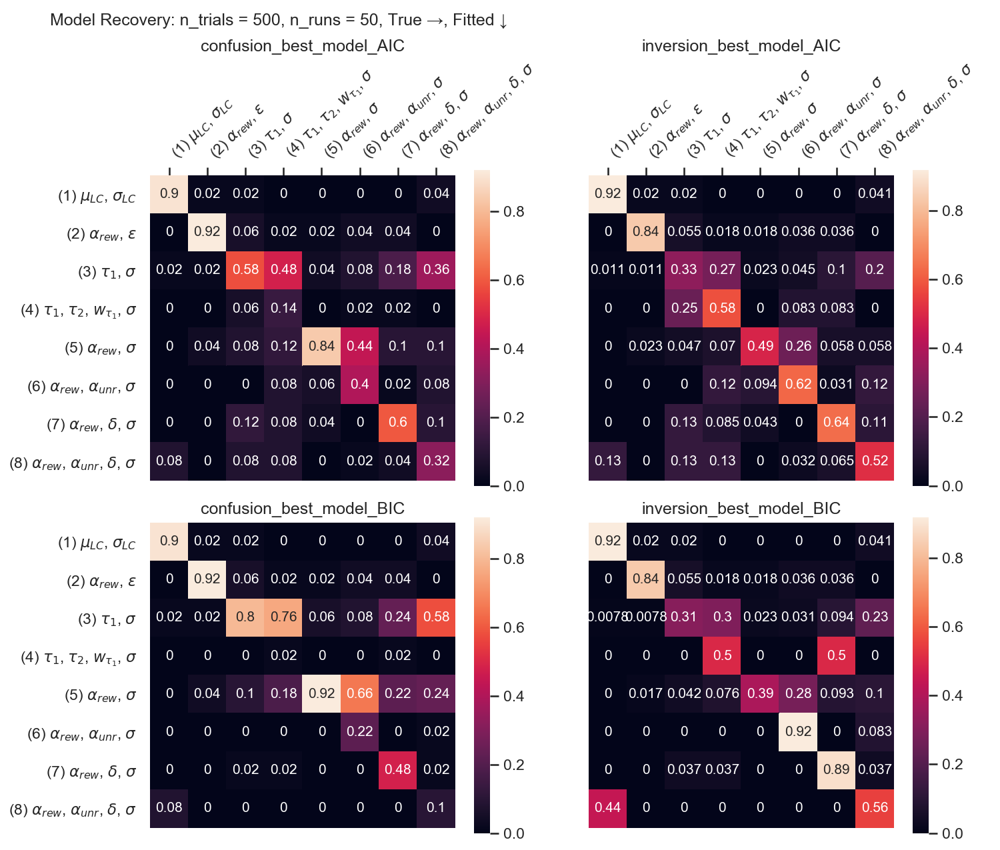

<IPython.core.display.Javascript object>


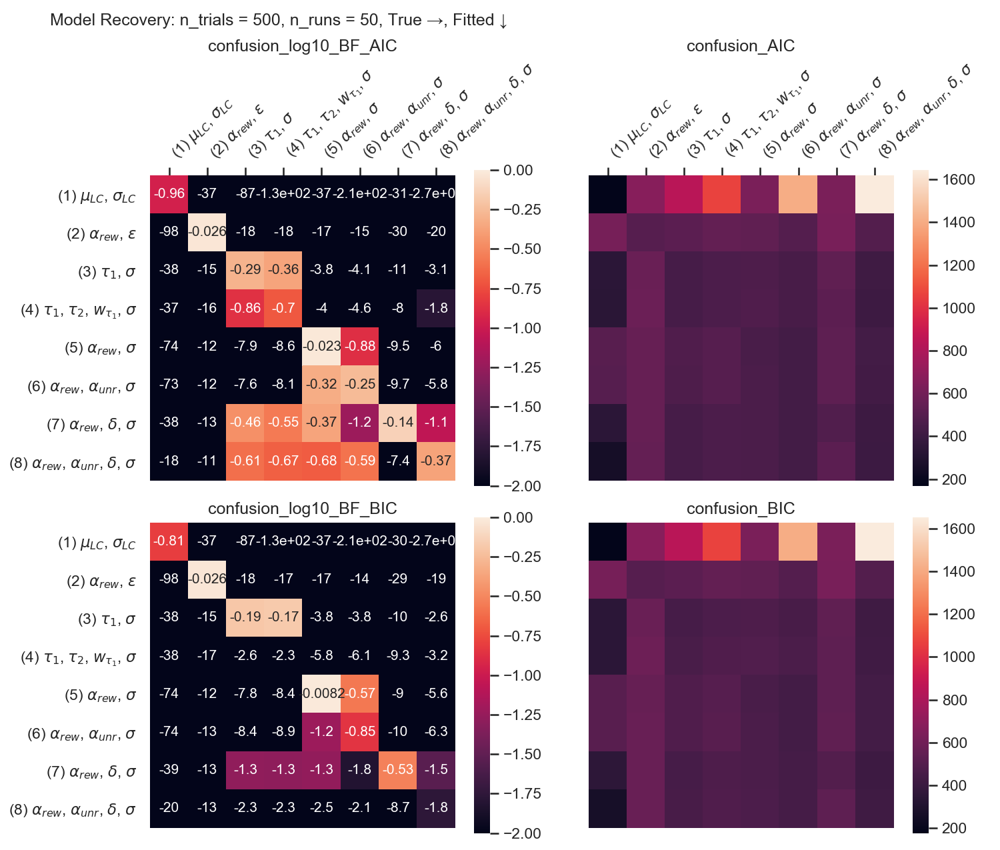

In [10]:
confusion_results = pickle.load(open(".\\results\\confusion_results_2_50_500.p", "rb"))
plot_confusion_matrix(confusion_results)

# Add bias terms (important for real data)

## Fit data with and without bias

Perfect!

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/15:    LossCounting, Km = 2 ... AIC = 1367.24, BIC = 1377.05 (done in 4.52 secs)
Model 2/15:     RW1972_epsi, Km = 2 ... AIC = 1279.99, BIC = 1289.81 (done in 6.64 secs)
Model 3/15:     LNP_softmax, Km = 2 ... AIC = 1234.53, BIC = 1244.35 (done in 4.56 secs)
Model 4/15:     LNP_softmax, Km = 4 ... AIC = 1237.91, BIC = 1257.54 (done in 10.2 secs)
Model 5/15:  RW1972_softmax, Km = 2 ... AIC = 1214.26, BIC = 1224.08 (done in 2.75 secs)
Model 6/15:     Hattori2019, Km = 3 ... AIC = 1212.42, BIC = 1227.15 (done in 7.06 secs)
Model 7/15:        Bari2019, Km = 3 ... AIC = 1216.17, BIC = 1230.89 (done in 4.9 secs)
Model 8/15:     Hattori2019, Km = 4 ... AIC = 1214.53, BIC = 1234.16 (done in 8.82 secs)
Model 9/15:     RW1972_epsi, Km = 3 ... AIC = 1285.38, BIC = 1300.11 (done in 5.11 secs)
Model 10/15:     LNP_softmax, Km = 3 ... AIC = 1236.39, BIC = 1251.12 (done in 7.11 secs)
Model 11/15:     LNP_softmax, Km = 5 .

<IPython.core.display.Javascript object>


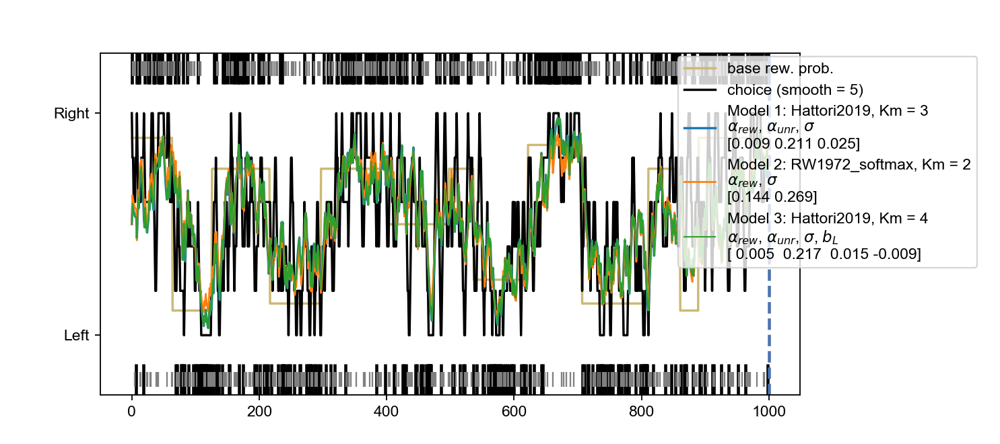

,model,Km,AIC,log10_BF_AIC,model_weight_AIC,BIC,log10_BF_BIC,model_weight_BIC,para_notation,para_fitted
6,Hattori2019,3,1212.42,-0.00,0.38,1227.15,-0.67,0.17,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$","[0.009, 0.211, 0.025]"
5,RW1972_softmax,2,1214.26,-0.40,0.15,1224.08,-0.00,0.77,"$\alpha_{rew}$, $\sigma$","[0.144, 0.269]"
13,Hattori2019,4,1214.38,-0.42,0.14,1234.01,-2.16,0.01,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$, $b_L$","[0.005, 0.217, 0.015, -0.009]"
8,Hattori2019,4,1214.53,-0.46,0.13,1234.16,-2.19,0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.016, 0.217, 0.0, 0.042]"
7,Bari2019,3,1216.17,-0.81,0.06,1230.89,-1.48,0.03,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.144, 0.003, 0.268]"
12,RW1972_softmax,3,1216.26,-0.83,0.06,1230.98,-1.50,0.02,"$\alpha_{rew}$, $\sigma$, $b_L$","[0.144, 0.269, -0.003]"
15,Hattori2019,5,1216.38,-0.86,0.05,1240.92,-3.66,0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$, $b_L$","[0.004, 0.214, 0.0, 0.01, -0.006]"
14,Bari2019,4,1218.17,-1.25,0.02,1237.80,-2.98,0.00,"$\alpha_{rew}$, $\delta$, $\sigma$, $b_L$","[0.144, 0.003, 0.268, -0.003]"
3,LNP_softmax,2,1234.53,-4.80,0.00,1244.35,-4.40,0.00,"$\tau_1$, $\sigma$","[7.134, 0.301]"
10,LNP_softmax,3,1236.39,-5.21,0.00,1251.12,-5.87,0.00,"$\tau_1$, $\sigma$, $b_L$","[7.125, 0.302, -0.026]"


<IPython.core.display.Javascript object>


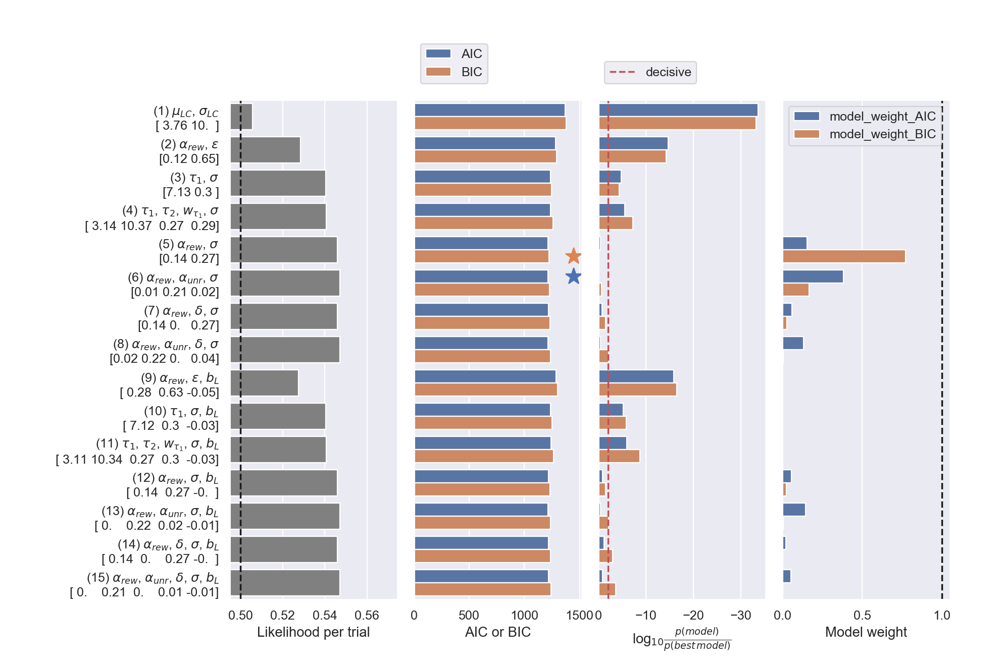

In [9]:
choice_history, reward_history, p_reward = generate_fake_data('RW1972_softmax', ['learn_rate_rew','softmax_temperature'], [0.2,0.3])
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward) 
model_comparison.fit(pool = pool, plot_predictive=[1,2,3]) # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()

=== Model Comparison ===
Methods = DE, {'DE_pop_size': 16}, pool = True
Model 1/15:    LossCounting, Km = 2 ... AIC = 1384.38, BIC = 1394.19 (done in 5.62 secs)
Model 2/15:     RW1972_epsi, Km = 2 ... AIC = 934.548, BIC = 944.364 (done in 16.3 secs)
Model 3/15:     LNP_softmax, Km = 2 ... AIC = 1075.36, BIC = 1085.18 (done in 13.4 secs)
Model 4/15:     LNP_softmax, Km = 4 ... AIC = 1172.65, BIC = 1192.28 (done in 24 secs)
Model 5/15:  RW1972_softmax, Km = 2 ... AIC = 1239.49, BIC = 1249.31 (done in 8 secs)
Model 6/15:     Hattori2019, Km = 3 ... AIC = 1392.29, BIC = 1407.02 (done in 3.54 secs)
Model 7/15:        Bari2019, Km = 3 ... AIC = 988.142, BIC = 1002.87 (done in 6.36 secs)
Model 8/15:     Hattori2019, Km = 4 ... AIC = 955.068, BIC = 974.699 (done in 13.1 secs)
Model 9/15:     RW1972_epsi, Km = 3 ... AIC = 917.138, BIC = 931.861 (done in 5.72 secs)
Model 10/15:     LNP_softmax, Km = 3 ... AIC = 905.22, BIC = 919.943 (done in 5.8 secs)
Model 11/15:     LNP_softmax, Km = 5 ... AIC

<IPython.core.display.Javascript object>


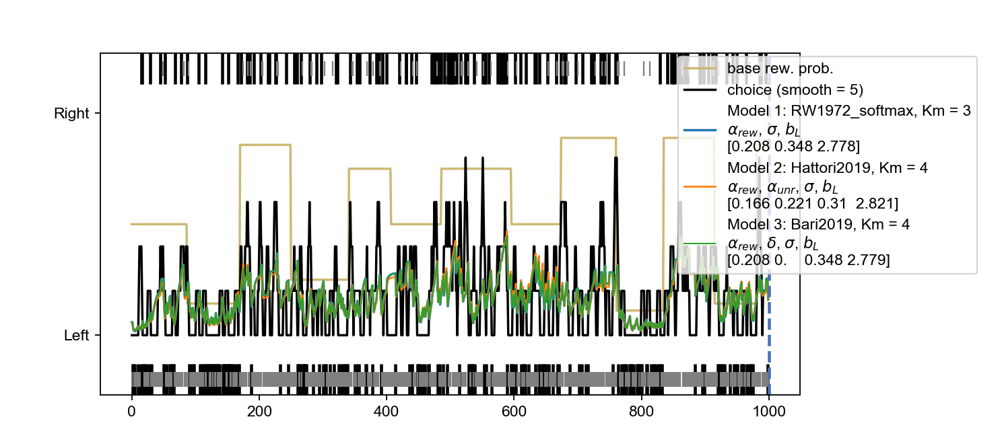

,model,Km,AIC,log10_BF_AIC,model_weight_AIC,BIC,log10_BF_BIC,model_weight_BIC,para_notation,para_fitted
12,RW1972_softmax,3,882.09,-0.00,0.50,896.81,-0.00,0.93,"$\alpha_{rew}$, $\sigma$, $b_L$","[0.208, 0.348, 2.778]"
13,Hattori2019,4,883.58,-0.32,0.24,903.21,-1.39,0.04,"$\alpha_{rew}$, $\alpha_{unr}$, $\sigma$, $b_L$","[0.166, 0.221, 0.31, 2.821]"
14,Bari2019,4,884.09,-0.43,0.18,903.72,-1.50,0.03,"$\alpha_{rew}$, $\delta$, $\sigma$, $b_L$","[0.208, 0.0, 0.348, 2.779]"
15,Hattori2019,5,885.58,-0.76,0.09,910.11,-2.89,0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$, $b_L$","[0.166, 0.221, 0.0, 0.31, 2.821]"
10,LNP_softmax,3,905.22,-5.02,0.00,919.94,-5.02,0.00,"$\tau_1$, $\sigma$, $b_L$","[4.511, 0.462, 1.46]"
11,LNP_softmax,5,909.22,-5.89,0.00,933.76,-8.02,0.00,"$\tau_1$, $\tau_2$, $w_{\tau_1}$, $\sigma$, $b_L$","[4.511, 10.511, 1.0, 0.462, 1.46]"
9,RW1972_epsi,3,917.14,-7.61,0.00,931.86,-7.61,0.00,"$\alpha_{rew}$, $\epsilon$, $b_L$","[0.783, 0.881, 0.414]"
2,RW1972_epsi,2,934.55,-11.39,0.00,944.36,-10.33,0.00,"$\alpha_{rew}$, $\epsilon$","[0.001, 0.351]"
8,Hattori2019,4,955.07,-15.85,0.00,974.70,-16.91,0.00,"$\alpha_{rew}$, $\alpha_{unr}$, $\delta$, $\sigma$","[0.075, 0.0, 0.008, 0.226]"
7,Bari2019,3,988.14,-23.03,0.00,1002.87,-23.03,0.00,"$\alpha_{rew}$, $\delta$, $\sigma$","[0.0, 0.001, 0.01]"


<IPython.core.display.Javascript object>


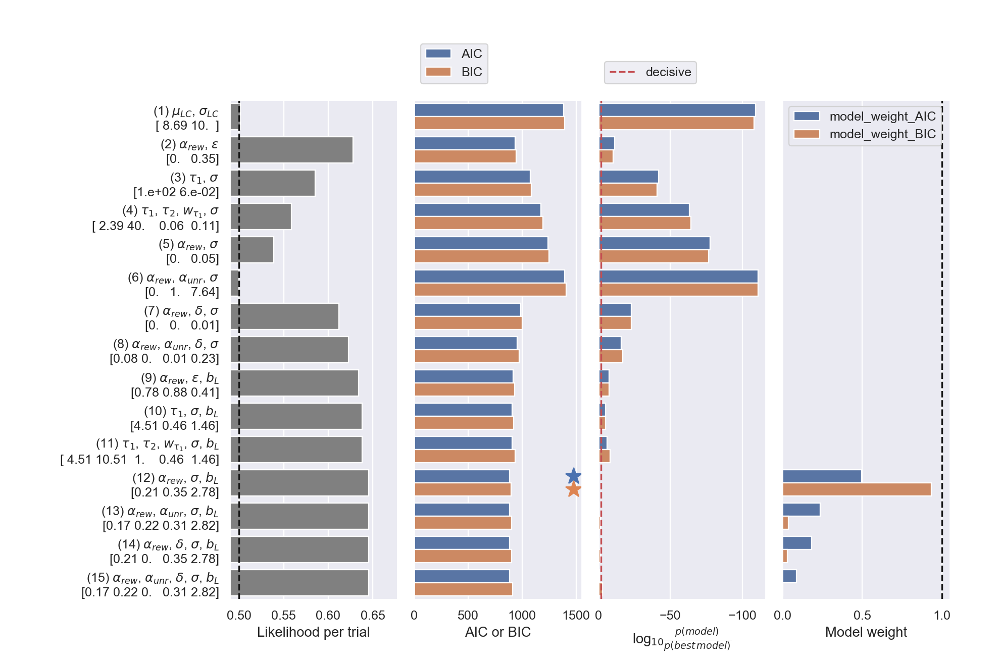

In [10]:
choice_history, reward_history, p_reward = generate_fake_data('RW1972_softmax', ['learn_rate_rew','softmax_temperature', 'biasL'], [0.2,0.3,3])
model_comparison = BanditModelComparison(choice_history, reward_history, p_reward)
model_comparison.fit(pool = pool, plot_predictive=[1,2,3]) # Plot predictive traces for the 1st, 2nd, and 3rd models
model_comparison.show()
model_comparison.plot()

## Confusion matrix

Let's use fewer models and focus on bias.

```python
def generate_random_para(forager, para_name):
    # With slightly narrower range than fitting bounds in BanditModelComparison
    if para_name in 'loss_count_threshold_mean':
        return np.random.uniform(0, 30)
    if para_name in 'loss_count_threshold_std':
        return np.random.uniform(0, 5)
    if para_name in ['tau1', 'tau2']:
        return 10**np.random.uniform(0, np.log10(30)) 
    if para_name in ['w_tau1', 'learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'epsilon']:
        return np.random.uniform(0, 1)
    if para_name in 'softmax_temperature':
        return 1/np.random.exponential(10)
    if para_name in ['biasL']:
        if forager in ['Random', 'pMatching', 'RW1972_epsi']:
            return np.random.uniform(-0.45, 0.45)
        elif forager in ['RW1972_softmax', 'LNP_softmax', 'Bari2019', 'Hattori2019']:
            return np.random.uniform(-5, 5)
```

In [3]:
models = [
            # No bias (1-8)
            # ['LossCounting', ['loss_count_threshold_mean', 'loss_count_threshold_std'], [0,0], [40,10]],                   
            ['RW1972_epsi', ['learn_rate_rew', 'epsilon'],[0, 0],[1, 1]],
            ['LNP_softmax',  ['tau1', 'softmax_temperature'], [1e-3, 1e-2], [100, 15]],                 
            # ['LNP_softmax', ['tau1', 'tau2', 'w_tau1', 'softmax_temperature'],[1e-3, 1e-1, 0, 1e-2],[15, 40, 1, 15]],                 
            ['RW1972_softmax', ['learn_rate_rew', 'softmax_temperature'],[0, 1e-2],[1, 15]],
            # ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            ['Bari2019', ['learn_rate_rew', 'forget_rate', 'softmax_temperature'],[0, 0, 1e-2],[1, 1, 15]],
            # ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'softmax_temperature'],[0, 0, 0, 1e-2],[1, 1, 1, 15]],
            
            # With bias (9-16)
            ['RW1972_epsi', ['learn_rate_rew', 'epsilon', 'biasL'],[0, 0, -0.5],[1, 1, 0.5]],
            ['LNP_softmax',  ['tau1', 'softmax_temperature', 'biasL'], [1e-3, 1e-2, -5], [100, 15, 5]],                 
            # ['LNP_softmax', ['tau1', 'tau2', 'w_tau1', 'softmax_temperature', 'biasL'],[1e-3, 1e-1, 0, 1e-2, -5],[15, 40, 1, 15, 5]],                 
            ['RW1972_softmax', ['learn_rate_rew', 'softmax_temperature', 'biasL'],[0, 1e-2, -5],[1, 15, 5]],
            # ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'softmax_temperature', 'biasL'],[0, 0, 1e-2, -5],[1, 1, 15, 5]],
            ['Bari2019', ['learn_rate_rew', 'forget_rate', 'softmax_temperature', 'biasL'],[0, 0, 1e-2, -5],[1, 1, 15, 5]],
            # ['Hattori2019', ['learn_rate_rew', 'learn_rate_unrew', 'forget_rate', 'softmax_temperature', 'biasL'],[0, 0, 0, 1e-2, -5],[1, 1, 1, 15, 5]],
         ]

compute_confusion_matrix(models = models, n_runs = 100, n_trials = 1000, pool = pool, 
                         save_file = 'confusion_results_3_100_1000_bias.p')

Runs: 100%|██████████████████████████████████████████████████████████████████████| 100/100 [10:55:00<00:00, 393.00s/it]


<IPython.core.display.Javascript object>


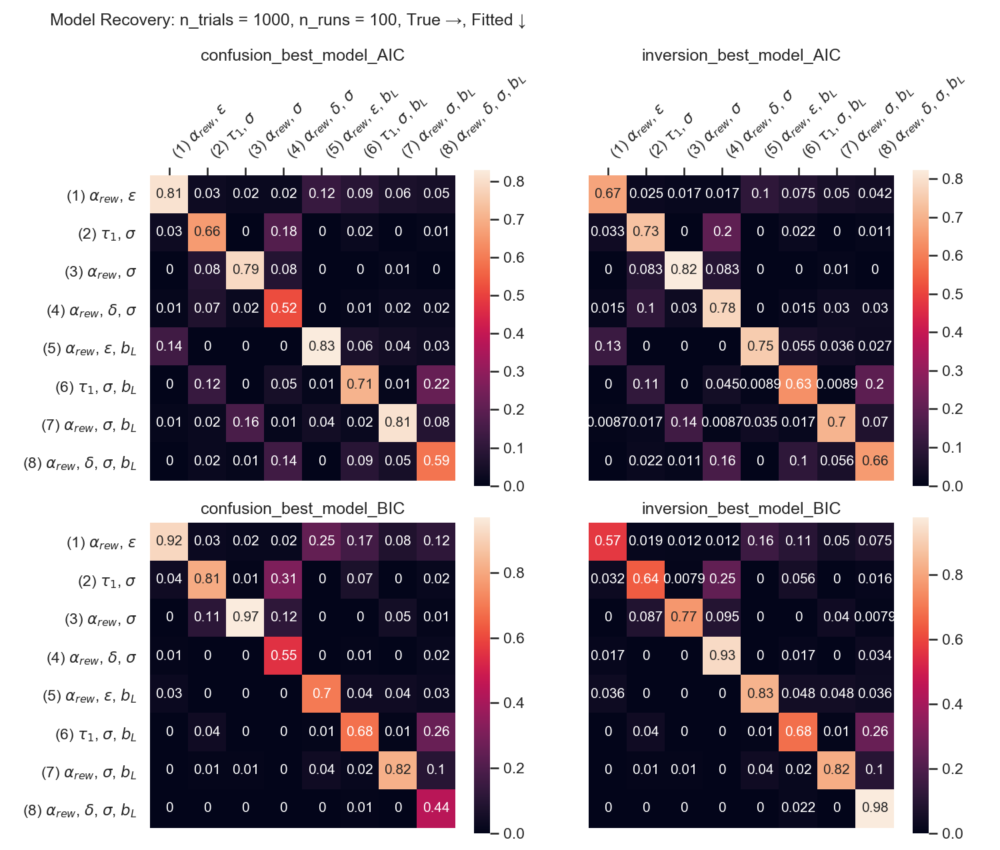

<IPython.core.display.Javascript object>


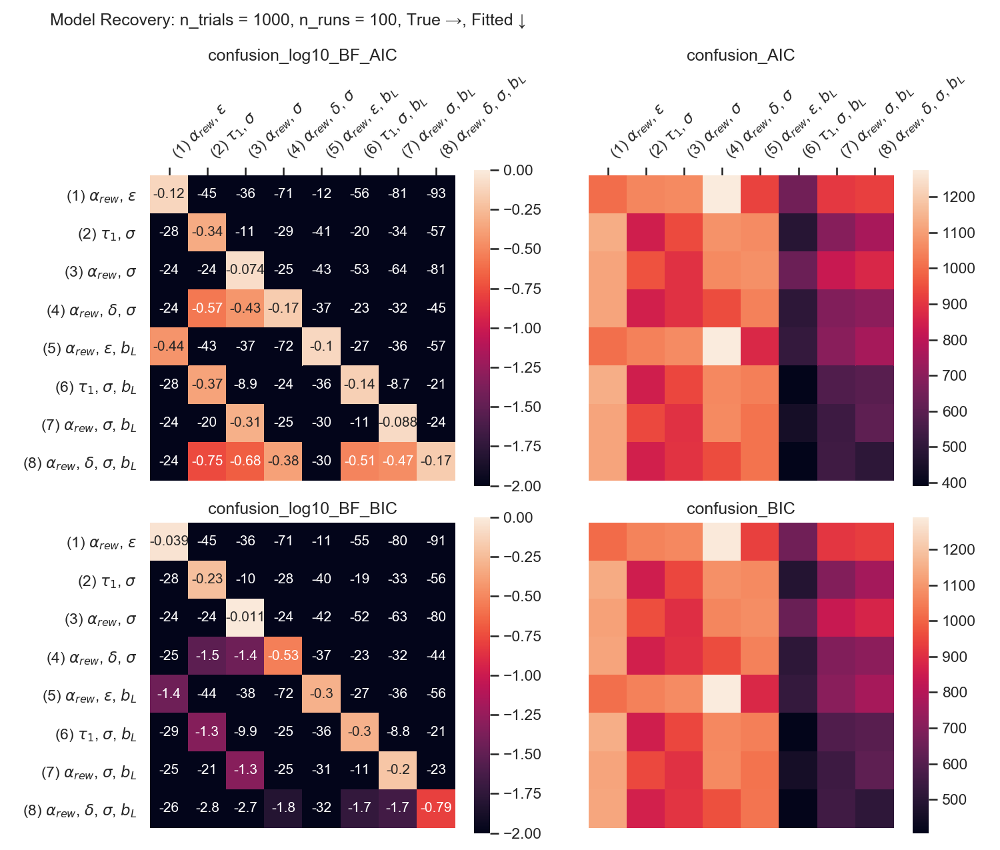

In [11]:
confusion_results = pickle.load(open(".\\results\\confusion_results_3_100_1000_bias.p", "rb"))
plot_confusion_matrix(confusion_results)